<a href="https://colab.research.google.com/github/afan104/cell_image_models/blob/master/MaskRCNNCells.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 0. Import libraries & Workspace setup
- install and import libraries
- set seed
- device agnostic code
- mount google drive and set working directory

In [1]:
%pip install cjm_psl_utils cjm_pil_utils cjm_pytorch_utils cjm_pandas_utils cjm_torchvision_tfms distinctipy torchtnt

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 163.5/163.5 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 31.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 16.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 11.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 6.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.1/21.1 MB 50.5 MB/s eta 0:00:00
  Attempting uninstall: nvidia-nvjitlink-cu12
    Found existing installation: nvidia-nvjitlink-cu12 12.5.82
    Uninstalli

In [2]:
# Import Python Standard Library dependencies
import datetime
from functools import partial
from glob import glob
import json
import math
import multiprocessing
import os
from pathlib import Path
import random
from typing import Any, Dict, Optional
import sys

# Import utility functions
from cjm_pytorch_utils.core import tensor_to_pil
from cjm_pandas_utils.core import markdown_to_pandas

# Import the distinctipy module
from distinctipy import distinctipy

# Import matplotlib for creating plots
import matplotlib.pyplot as plt

# Import numpy
import numpy as np

# Import the pandas package
import pandas as pd

# Set options for Pandas DataFrame display
pd.set_option('max_colwidth', None)  # Do not truncate the contents of cells in the DataFrame
pd.set_option('display.max_rows', None)  # Display all rows in the DataFrame
pd.set_option('display.max_columns', None)  # Display all columns in the DataFrame

# Import PIL for image manipulation
from PIL import Image, ImageDraw

# Import PyTorch dependencies
import torch
from torch.amp import autocast
from torch.cuda.amp import GradScaler
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchtnt.utils import get_module_summary
import torchvision
torchvision.disable_beta_transforms_warning()
from torchvision.tv_tensors import BoundingBoxes, Mask
from torchvision.utils import draw_bounding_boxes, draw_segmentation_masks
import torchvision.transforms.v2  as transforms
from torchvision.transforms.v2 import functional as TF

# Import Mask R-CNN
from torchvision.models.detection import maskrcnn_resnet50_fpn_v2, MaskRCNN
from torchvision.models.detection import MaskRCNN_ResNet50_FPN_V2_Weights
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
from torchvision.models.detection.mask_rcnn import MaskRCNNPredictor

# Import tqdm for progress bar
from tqdm.auto import tqdm

In [3]:
## Set random seed
seed = 1234
random.seed(seed)

In [4]:
# set up device agnostic code
device = "cuda" if torch.cuda.is_available() else 'cpu'
dtype = torch.float32
device, dtype

('cuda', torch.float32)

In [5]:
# mount google drive
from google.colab import drive
drive.mount('/content/drive')

# change dir
os.chdir("/content/drive/MyDrive/Capaldi/MaskRCNNPrototype")

Mounted at /content/drive


# 1. Load in Data
- Visualize sample image
  - create_polygon_mask function
  - download font file
- Load and organize all data into variables
- Visualize distribution of classes

## 1.0 TEST: Visualizing a Single Sample Image
- checking annotation rendering before annotating the rest of the images

Image Dims: (1608, 1608)


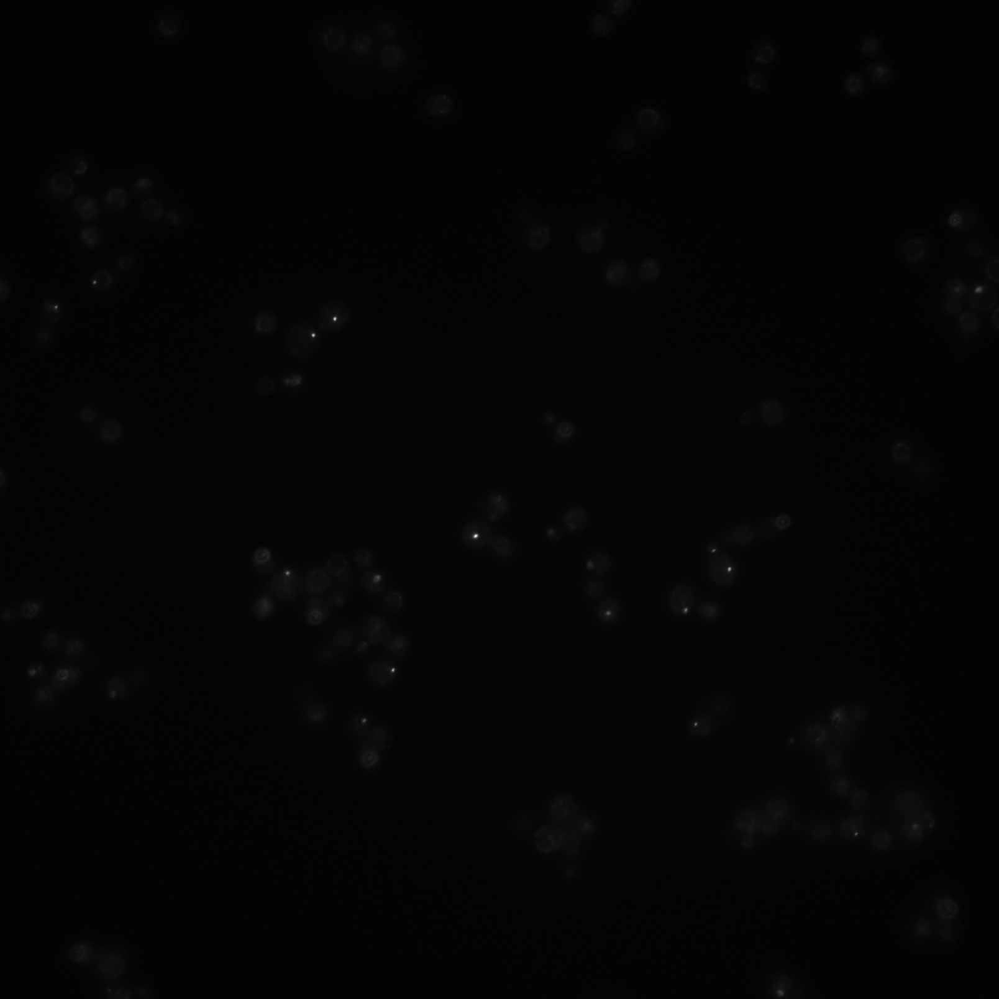

In [ ]:
# Get the file ID of the first image file
file_id = "/content/drive/MyDrive/Capaldi/Data/Test/test.png"
# Open the associated image file as a RGB image
sample_img = Image.open(file_id).convert('RGB')

# Print the dimensions of the image
print(f"Image Dims: {sample_img.size}")

# Show the image
sample_img

In [ ]:
# convert test json file to pd dataframe
test_df = pd.read_json("/content/drive/MyDrive/Capaldi/Data/Test/test.json", orient="index").transpose()
test_df

,PSversion,shapes,lineColor,fillColor,imageName,ImageHeight,ImageWidth
0,25.9.1,"[{'label': 'normal', 'points': [[167.999955654144, 466.000010490417], [179.000002384186, 452.000038146973], [172.999959468842, 437.999969959259], [165.999973297119, 434.000005245209], [152.000000953674, 442.999973773956], [148.999979496002, 452.000038146973], [148.999979496002, 457.999985218048]]}, {'label': 'normal', 'points': [[133.000024795532, 383.999967098236], [148.000036239624, 395.999957084656], [163.000047683716, 386.999988555908], [163.000047683716, 376.000037670135], [153.999983310699, 364.999990940094], [143.999975681305, 366.000030040741], [133.99996805191, 373.999959468842]]}, {'label': 'normal', 'points': [[145.99995803833, 356.000022411346], [158.000043869019, 349.000036239624], [157.000004768372, 329.000020980835], [143.999975681305, 324.000017166138], [128.999964237213, 349.000036239624]]}]","[0, 100, 200, 255]","[100, 0, 200, 255]",~/Desktop/Clear/Masks/fz_3244_t360_Nstarve001_1.png,1608 px,1608 px


In [ ]:
# convert whole json file to pd dataframe
sample_img_df = pd.read_json("/content/drive/MyDrive/Capaldi/Data/Test/fz_3244_t360_Nstarve001_1.json", orient="index").transpose()
sample_img_df

PSversion  \
0    25.9.1   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                   

In [ ]:
# convert sgementation polygons to images
def create_polygon_mask(image_size, vertices):
    """
    Create a grayscale image with a white polygonal area on a black background.

    Parameters:
    - image_size (tuple): A tuple representing the dimensions (width, height) of the image.
    - vertices (list): A list of tuples, each containing the x, y coordinates of a vertex
                        of the polygon. Vertices should be in clockwise or counter-clockwise order.

    Returns:
    - PIL.Image.Image: A PIL Image object containing the polygonal mask.
    """

    # Create a new black image with the given dimensions
    mask_img = Image.new('L', image_size, 0)

    # Draw the polygon on the image. The area inside the polygon will be white (255).
    ImageDraw.Draw(mask_img, 'L').polygon(vertices, fill=(255))

    # Return the image with the drawn polygon
    return mask_img

In [ ]:
# Extract labels for sample
labels = [shape['label'] for shape in sample_img_df['shapes'][0]]
# Extract polygon points as a list of shapes each containing a list of points
shape_points = [shape['points'] for shape in sample_img_df['shapes'][0]]; print(f"no. of shapes: {len(shape_points)}")
# Converts points lists into tuples for PIL format
xy_coords = [[tuple(p) for p in points] for points in shape_points]
# Generate mask images from polygons (create_polygon_mask function used)
mask_imgs = [create_polygon_mask(sample_img.size, xy) for xy in xy_coords]
# Convert mask images to tensors
masks = torch.concat(
    [
        Mask(transforms.PILToTensor()(mask_img),
             dtype=torch.bool
             ) for mask_img in mask_imgs
        ]
    )
# Generate bounding box annotations from segmentation masks
bboxes = torchvision.ops.masks_to_boxes(masks)

no. of shapes: 120


Downloading font file

In [ ]:
import requests

# Set the name of the font file
font_file = 'KFOlCnqEu92Fr1MmEU9vAw.ttf'
url = f"https://fonts.gstatic.com/s/roboto/v30/{font_file}"

# Download the font file
if font_file in os.listdir():
  print(f"{font_file} already exists")
else:
  with open(font_file,"wb") as f:
    r = requests.get(url)
    f.write(r.content)
    print(f"{font_file} downloaded!")

draw_bboxes = partial(draw_bounding_boxes, fill=False, width=2, font=font_file, font_size=25)

KFOlCnqEu92Fr1MmEU9vAw.ttf already exists


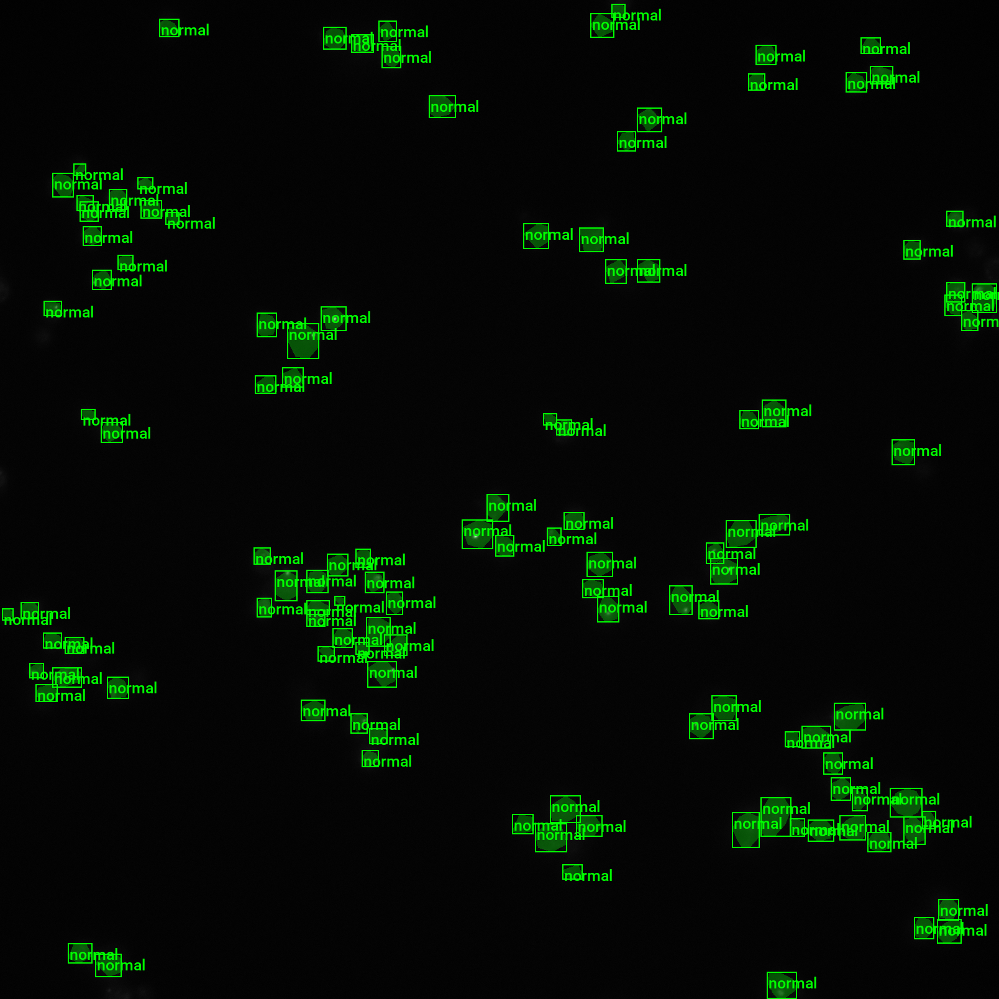

In [ ]:
# Annotate the sample image with segmentation masks
color = (0,255,0)
annotated_tensor = draw_segmentation_masks(
    image=transforms.PILToTensor()(sample_img),
    masks=masks,
    alpha=0.3,
    colors=[color for i in range(120)]
)

# Annotate the sample image with labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=annotated_tensor,
    boxes=bboxes,
    labels=labels,
    colors=[color for i in range(120)]
)

tensor_to_pil(annotated_tensor)

## 2.1 Loading the data
- get image and mask file paths and display side by side in dataframe (visualization purposes only)
- Create dictionary of image paths {img1: path, img2: path, ...}
- Create mask dataframe (filename_index, PSversion, shapes, lineColor, fillColor, imageName, ImageHeight, ImageWidth)

### 2.1.1 visualize image and annotation file lists

In [ ]:
# dataset path
project_dir = Path('/content/drive/MyDrive/Capaldi/MaskRCNNPrototype')
dataset_path = Path(f'{project_dir}/Data')

# Get a list of image files in the dataset
img_file_paths = list(dataset_path.glob('*.png'))

# Get a list of JSON files in the dataset
annotation_file_paths = list(dataset_path.glob('*.json'))

# Display the names of the folders using a Pandas DataFrame
pd.DataFrame({"Image File": [file.name for file in img_file_paths],
              "Annotation File":[file.name for file in annotation_file_paths]}).head()

,Image File,Annotation File
0,fz_173_t0_AAstarve001_1.png,fz_173_t0_AAstarve001_1.json
1,fz_173_t30_AAstarve001_1.png,fz_173_t0_AAstarve_1.json
2,fz_173_t0_Glustarve001_1.png,fz_173_t360_Nstarve_1.json
3,fz_173_t30_AAstarve_1.png,fz_3244_t360_Nstarve001_1.json
4,fz_173_t0_Glustarve_1.png,fz_173_t0_Glustarve_1.json


### 2.1.2 Get img_dict

In [ ]:
# Create a dictionary that maps file names to file paths
img_dict = {file.stem : file for file in img_file_paths}

# Print the number of image files
print(f"Number of Images: {len(img_dict)}")

# Display the first five entries from the dictionary using a Pandas DataFrame
pd.DataFrame.from_dict(img_dict, orient='index').head()

Number of Images: 20


,0
fz_173_t0_AAstarve001_1,/content/drive/MyDrive/Capaldi/MaskRCNNPrototype/Data/fz_173_t0_AAstarve001_1.png
fz_173_t30_AAstarve001_1,/content/drive/MyDrive/Capaldi/MaskRCNNPrototype/Data/fz_173_t30_AAstarve001_1.png
fz_173_t0_Glustarve001_1,/content/drive/MyDrive/Capaldi/MaskRCNNPrototype/Data/fz_173_t0_Glustarve001_1.png
fz_173_t30_AAstarve_1,/content/drive/MyDrive/Capaldi/MaskRCNNPrototype/Data/fz_173_t30_AAstarve_1.png
fz_173_t0_Glustarve_1,/content/drive/MyDrive/Capaldi/MaskRCNNPrototype/Data/fz_173_t0_Glustarve_1.png


### 2.1.3 Mask dataframe

In [ ]:
import re
# create generator of json dataframes
mask_dataframes = (pd.read_json(f, orient='index').transpose() for f in tqdm(annotation_file_paths))

# concatenate into single dataframe
annotation_df = pd.concat(mask_dataframes, ignore_index=False)

# assign image filename as index
# annotation_df['index'] = annotation_df.apply(lambda row: row['imageName'].split('.')[0], axis = 1) # axis 1 applies on rows
annotation_df['index'] = annotation_df.apply(lambda row: re.split(r'[./]', row['imageName'])[-2], axis = 1) # axis 1 applies on rows, re.split splits on both . and / characters
annotation_df = annotation_df.set_index('index')

# keep rows that correspond to filenames in the img_dict
annotation_df = annotation_df.loc[list(img_dict.keys())]

# print head
annotation_df.head(1)

  0%|          | 0/20 [00:00<?, ?it/s]

PSversion  \
index                               
fz_173_t0_AAstarve001_1    25.9.1   

                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                        

## 2.2 Inspecting class distributions
- Create dataframe separating the individual shapes into rows
- Visualize the distribution frequencies of each class

### 2.2.1 Create shapes dataframe
- where each individual shape has it's own row, and "label" is in a separate column

In [ ]:
# Take shape column: Use explode() to separate each shape in an image as its own row
# img1 w 49 shapes -> 49 rows indexed identically by img1
# convert to dataframe to be correct final format type
shapes_df = annotation_df['shapes'].explode().to_frame()

# apply to shapes column to convert to series (separate column)
shapes_df = shapes_df["shapes"].apply(pd.Series)

# get unique class names from shapes df
class_names = list(shapes_df["label"].unique())
class_names

['kogg', 'normal']

### 2.2.2 Visualize class distribution

In [ ]:
class_counts = shapes_df['label'].value_counts()
class_counts

,count
label,
normal,1704
kogg,140


<Axes: title={'center': 'Class Distribution'}, xlabel='Classes', ylabel='Count'>

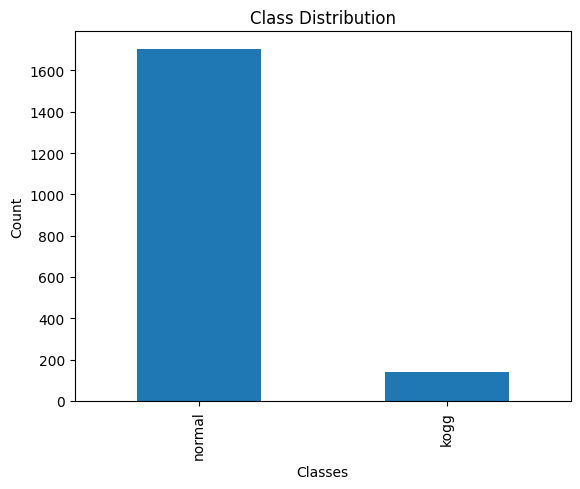

In [ ]:
# plot
class_counts.plot(kind = "bar", xlabel = "Classes", ylabel = "Count", title = "Class Distribution")

In [ ]:
# Preprend 'background' class
class_names.insert(0,'background')
class_names

['background', 'kogg', 'normal']

## 2.3 Visualizing Image Annotations

### 2.3.1 Generate a colormap
- unique colors using distinctipy

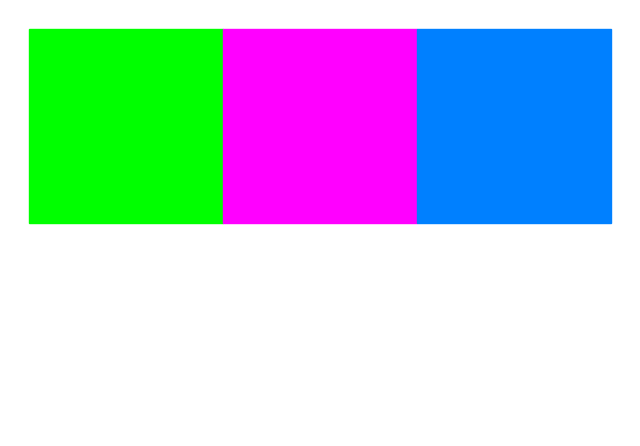

In [ ]:
# Generate colors list
colors = distinctipy.get_colors(len(class_names))

# scale by 255 and convert to integer
int_colors = [tuple(int(255*value) for value in color) for color in colors]

# visualize
colors
distinctipy.color_swatch(colors)

### 2.3.2 Generate Bounding Box Function
- Initialize partial function with no fill, and constant width, font, and font size.

In [ ]:
import requests

# Set the name of the font file
font_file = 'KFOlCnqEu92Fr1MmEU9vAw.ttf'
url = f"https://fonts.gstatic.com/s/roboto/v30/{font_file}"

# Download the font file
if font_file in os.listdir():
  print(f"{font_file} already exists")
else:
  with open(font_file,"wb") as f:
    r = requests.get(url)
    f.write(r.content)
    print(f"{font_file} downloaded!")

draw_bboxes = partial(draw_bounding_boxes, fill=False, width=2, font=font_file, font_size=12)

KFOlCnqEu92Fr1MmEU9vAw.ttf already exists


## 2.4 Display Sample Image with Bounding Boxes

### 2.4.1 Display Single Test Image

Image Dims: (1608, 1608)


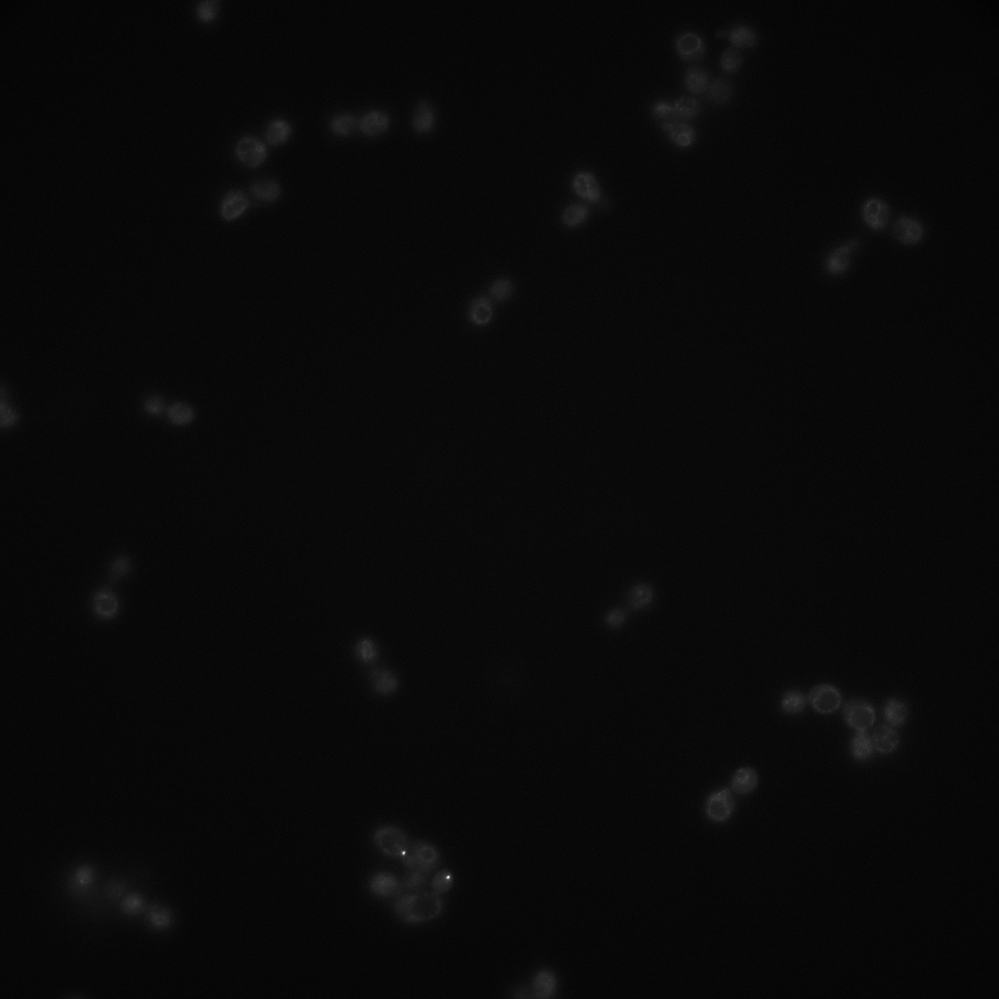

In [ ]:
# Get the file ID of the first image file
file_id = list(img_dict.keys())[0]

# Open the associated image file as a RGB image
sample_img = Image.open(img_dict[file_id]).convert('RGB')

# Print the dimensions of the image
print(f"Image Dims: {sample_img.size}")

# Show the image
sample_img

### 2.4.2 Visualize Image with Annotations

In [ ]:
# Get corresponding annotations
annotation_df.loc[file_id].to_frame()

fz_173_t0_AAstarve001_1
PSversion                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                                               

#### Define function to create a mask for each individual shape in one image

In [ ]:
# convert segmentations polygons to images
def create_polygon_mask(image_size, vertices):
  '''
  Initializes a black background and draws a SINGLE white shape mask on top.
  Returns: PIL Image object
  Parameters:
  - image_size (tuple): (width, height)
  - vertices ( list(tuple) ): e.g. [(1,2), (3,4), etc.] defining the points of one shape
  '''
  # Initialize image with correct dimensions (black)
  mask_img = Image.new("L", image_size, 0)

  # Draw polygon (white)
  ImageDraw.Draw(mask_img, "L").polygon(vertices, fill = (255))
  return mask_img

#### Extract all shapes info

In [ ]:
# Extract the labels
labels = [shape['label'] for shape in annotation_df.loc[file_id]['shapes']]
# Extract the points as List(List(List))
shape_points = [shape['points'] for shape in annotation_df.loc[file_id]['shapes']]
# PIL Formatting: convert lists to tuples List(List(Tuples))
all_shapes = [[tuple(p) for p in points] for points in shape_points]

#### Generate masks and Bounding Boxes

In [ ]:
# Generate mask images from polygons
mask_imgs = [create_polygon_mask(sample_img.size, shape) for shape in all_shapes]
# Image -> Tensor
masks = torch.concat(
    [
        Mask(transforms.PILToTensor()(mask_img),
             dtype=torch.bool
             ) for mask_img in mask_imgs
        ]
    )
# Generate bounding box annotations from segmentation masks
bboxes = torchvision.ops.masks_to_boxes(masks)

#### Annotation

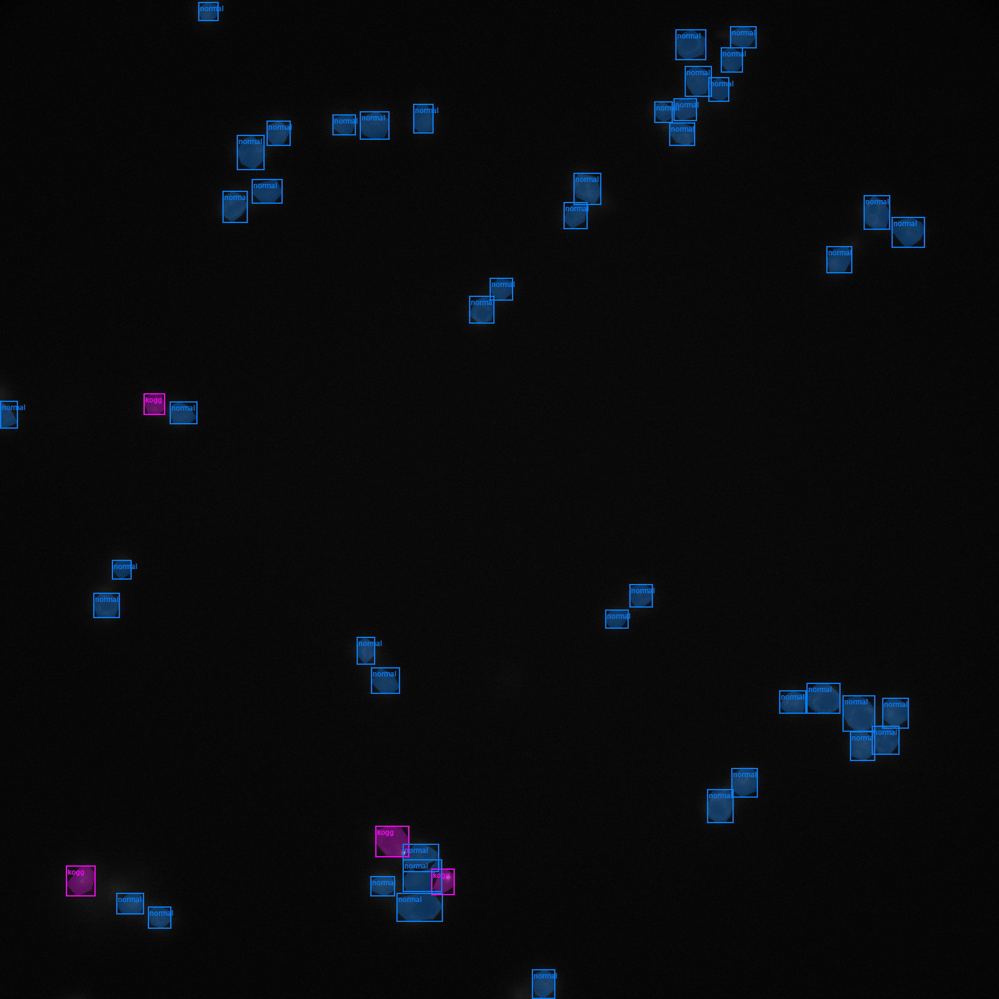

In [ ]:
# Segmentation masks
annotated_tensor = draw_segmentation_masks(
    image=transforms.PILToTensor()(sample_img),
    masks=masks,
    alpha=0.3,
    colors=[int_colors[i] for i in [class_names.index(label) for label in labels]]
)

# Bounding Boxes + Labels
annotated_tensor = draw_bboxes(
    image=annotated_tensor,
    boxes=bboxes,
    labels=labels,
    colors=[int_colors[i] for i in [class_names.index(label) for label in labels]]
)

tensor_to_pil(annotated_tensor)

# 2. Loading pretrained Model (COCO dataset)
- initialize pretrained model
- replace box predictor and mask predictor
- set device and datatype

In [ ]:
# Initialize pretrained model weights
model = maskrcnn_resnet50_fpn_v2(weights = "DEFAULT")

# Replace box predictor/classifier
box_pred_in_features = model.roi_heads.box_predictor.cls_score.in_features
model.roi_heads.box_predictor = FastRCNNPredictor(in_channels=box_pred_in_features,
                                                  num_classes=len(class_names))
# Replace mask predictor
#mask_pred_in_features = model.roi_heads.mask_predictor.conv5_mask.in_channels
#mask_pred_out_features = model.roi_heads.mask_predictor.conv5_mask.out_channels
#model.roi_heads.mask_predictor = MaskRCNNPredictor(in_channels=mask_pred_in_features,
#                                                  dim_reduced =mask_pred_out_features,
#                                                   num_classes = len(class_names))
# set device and datatype
model.to(device=device, dtype=dtype)

Downloading: "https://download.pytorch.org/models/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth" to /root/.cache/torch/hub/checkpoints/maskrcnn_resnet50_fpn_v2_coco-73cbd019.pth
100%|██████████| 177M/177M [00:01<00:00, 103MB/s]


MaskRCNN(
  (transform): GeneralizedRCNNTransform(
      Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
      Resize(min_size=(800,), max_size=1333, mode='bilinear')
  )
  (backbone): BackboneWithFPN(
    (body): IntermediateLayerGetter(
      (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace=True)
      (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
      (layer1): Sequential(
        (0): Bottleneck(
          (conv1): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
          (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
          (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
          (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
         

## 3.1 Model attributes
- name
- device

In [ ]:
model.device = device
model.name = 'maskrcnn_resnet50_fpn_v2'

## 3.2 Visualize Architecture

In [ ]:
random_tensor = torch.randn(1,3,1608,1608).to(device)

model_arch_df = markdown_to_pandas(f"{get_module_summary(model.eval(), [random_tensor])}")

# filter for only the model
model_arch_df = model_arch_df.iloc[0].drop(
    labels=["In size", "Out size", "Contains Uninitialized Parameters?"]
    )
model_arch_df

/usr/local/lib/python3.10/dist-packages/torchtnt/utils/module_summary.py:263: UserWarning: Backward FLOPs are only computed if module foward returns a tensor.
  warnings.warn(


,0
Type,MaskRCNN
# Parameters,45.9 M
# Trainable Parameters,45.7 M
Size (bytes),183 M
Forward FLOPs,333 G


# 3. Data Preparation
1. Split 80-20 using skm
2. Test out data transforms and augmentations
3. Create custom dataset
  - KoggClassifier subclassing Dataset
  - Custom Transforms
  - Create datasets & transfer to Dataloader

## 4.1 Split 80-20

In [ ]:
import sklearn.model_selection as skm

# Split files into test/train
file_IDs = list(img_dict.keys())
files_train, files_test = skm.train_test_split(file_IDs, train_size=0.8, test_size=0.2)

print(f"Training Samples: {len(files_train)}")
print(f"Testing samples: {len(files_test)}")

Training Samples: 16
Testing samples: 4


## 4.2 Test Data Augmentation

#### Sample Img

In [ ]:
import random
file_id = random.choice(list(img_dict.keys()))
sample_img = Image.open(img_dict[file_id]).convert("RGB")

#### Target info

In [ ]:
# Get labels
labels = [shape['label'] for shape in annotation_df.loc[file_id]['shapes']]
# Get shapes
shape_points = [shape['points'] for shape in annotation_df.loc[file_id]['shapes']]
# PIL Formatting: List[List[List]] -> List[List[Tuple]]
all_shapes = [[tuple(p) for p in points] for points in shape_points]
# Create Masks
mask_imgs = [create_polygon_mask(image_size=sample_img.size,vertices=shape) for shape in all_shapes]
# Mask -> Tensor
masks = torch.concat([Mask(transforms.PILToTensor()(mask_img), dtype = torch.bool) for mask_img in mask_imgs])
# Save Bounding Boxes (don't need to draw - Draw_Bounding_Boxes used later)
bboxes = BoundingBoxes(data=torchvision.ops.masks_to_boxes(masks), format = 'xyxy', canvas_size=sample_img.size[::-1])
# Save as a dictionary
targets = {
    'masks': Mask(masks),
    'boxes': bboxes,
    'labels': torch.Tensor([class_names.index(label) for label in labels])
}

#### Transform Image and Target

In [ ]:
# crop and pad
test_transforms = transforms.Compose([
    transforms.RandomIoUCrop(min_scale=0.3,
                             max_scale=1.0,
                             min_aspect_ratio=0.5,
                             max_aspect_ratio=2.0,
                             sampler_options=[0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
                             trials=400,
                             )
])
transformed_img, transformed_targets = test_transforms(sample_img, targets)
# sanitize bounding boxes from crop (required whenever RandomIOUCrop used)
sanitized_img, targets = transforms.SanitizeBoundingBoxes()(transformed_img, transformed_targets)

#### Annotate image

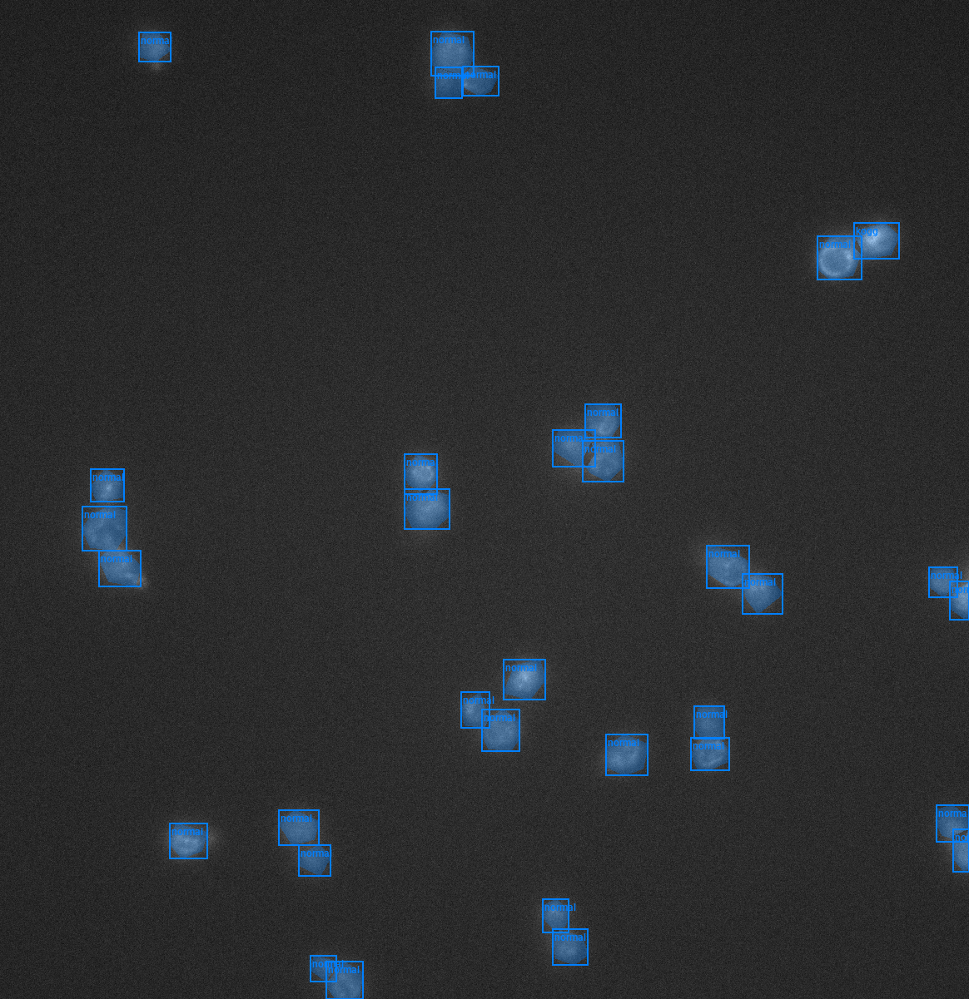

Source Image:,"(1608, 1608)"
Transformed Image,"(1164, 1201)"


In [ ]:
# samples colors
sample_colors = [int_colors[i] for i in [class_names.index(label) for label in labels]]

# Annotate the sample image with segmentation masks
annotated_tensor = draw_segmentation_masks(
    image=transforms.PILToTensor()(sanitized_img),
    masks=targets['masks'],
    alpha=0.3,
    colors=sample_colors
)

# Annotate the sample image with labels and bounding boxes
annotated_tensor = draw_bboxes(
    image=annotated_tensor,
    boxes=targets['boxes'],
    labels=[class_names[int(label.item())] for label in targets['labels']],
    colors=sample_colors
)

# # Display the annotated image
display(tensor_to_pil(annotated_tensor))

pd.Series({
    "Source Image:": sample_img.size,
    "Transformed Image": transformed_img.size
}).to_frame().style.hide(axis='columns')

## 4.3 Prepare Custom Dataset
  - KoggClassifier subclassing Dataset
  - Custom Transforms
  - Create datasets & transfer to Dataloader

### 4.3.1 Create KoggClassifier by subclassing Dataset

In [ ]:
class KoggClassifier(Dataset):
  def __init__(self, img_keys, annotation_df, img_dict, class_to_idx, transforms = None):
    """
    Parameters:
        img_keys (list): List of unique identifiers for images.
        annotation_df (DataFrame): DataFrame containing the image annotations.
        img_dict (dict): Dictionary mapping image identifiers to image file paths.
        class_to_idx (dict): Dictionary mapping class labels to indices.
        transforms (callable, optional): Optional transform to be applied on a sample.
    """
    super().__init__()

    self.img_keys = img_keys
    self.annotation_df = annotation_df
    self.img_dict = img_dict
    self.class_to_idx = class_to_idx
    self.transforms = transforms

  def __len__(self):
    """
    Returns length of dataset.
    """
    return len(self.img_keys)
  def __getitem__(self, index):
    """
    Returns a tupel containing image and target annotations.
    """
    img_key = self.img_keys[index]
    annotation = self.annotation_df.loc[img_key]
    image, target = self.load_image_and_target(annotation)

    if self.transforms:
      image, target = self.transforms(image, target)

    return image, target
  def load_image_and_target(self, annotation):
    """
    Load image and its target from giving the annotation

    Parameters:
    annotation (pd.Series): image annotation

    Returns:
    Tuple containing image and dictionary with 'boxes' and 'labels'
    """
    # get image
    filepath = self.img_dict[annotation.name]
    image = Image.open(filepath).convert("RGB")

    # convert labels to indices
    labels = torch.Tensor(
        [self.class_to_idx[
            shape['label']
            ] for shape in annotation['shapes']]
    ).to(dtype=torch.int64)

    # get masks
    shape_points = [shape['points'] for shape in annotation['shapes']]
    all_shapes = [[tuple(p) for p in points] for points in shape_points]
    mask_imgs = [create_polygon_mask(image.size, shape) for shape in all_shapes]
    masks = Mask(torch.concat([Mask(transforms.PILToTensor()(mask_img), dtype=torch.bool) for mask_img in mask_imgs]))

    # get bounding boxes
    bboxes = BoundingBoxes(data=torchvision.ops.masks_to_boxes(masks), format='xyxy', canvas_size=image.size[::-1])

    return image, {'masks': masks,'boxes': bboxes, 'labels': labels}

### 4.3.2 Create Custom Transforms

In [ ]:
# Transforms for data aug
# Compose transforms for data augmentation
data_aug_tfms = transforms.Compose(
    transforms=[
        transforms.RandomIoUCrop(min_scale=0.3,
                             max_scale=1.0,
                             min_aspect_ratio=0.5,
                             max_aspect_ratio=2.0,
                             sampler_options=[0.0, 0.1, 0.3, 0.5, 0.7, 0.9, 1.0],
                             trials=400,
                             ),
        transforms.ColorJitter(
                brightness = (0.875, 1.125),
                contrast = (0.5, 1.5),
                saturation = (0.5, 1.5),
                hue = (-0.05, 0.05),
        ),
        transforms.RandomGrayscale(),
        transforms.RandomEqualize(),
        transforms.RandomPosterize(bits=3, p=0.5),
        transforms.RandomHorizontalFlip(p=0.5),
    ],
)

# Compose transforms to sanitize bounding boxes and normalize input data
final_tfms = transforms.Compose([
    transforms.ToImage(),
    transforms.ToDtype(torch.float32, scale=True),
    transforms.SanitizeBoundingBoxes(),
])

# Define the transformations for training and validation datasets
train_tfms = transforms.Compose([
    data_aug_tfms,
    final_tfms
])
# valid_tfms is same as final_tfms

### 4.3.3 Create Dataset

In [ ]:
# Create a mapping from class names to class indices
class_to_idx = {c: i for i, c in enumerate(class_names)}

# Instantiate the datasets using the defined transformations
train_dataset = KoggClassifier(files_train, annotation_df, img_dict, class_to_idx, train_tfms)
valid_dataset = KoggClassifier(files_test, annotation_df, img_dict, class_to_idx, final_tfms)

# Print the number of samples in the training and validation datasets
print(f'Training dataset size: {len(train_dataset)}'),
print(f'Validation dataset size:: {len(valid_dataset)}')


Training dataset size: 16
Validation dataset size:: 4


Visualization:

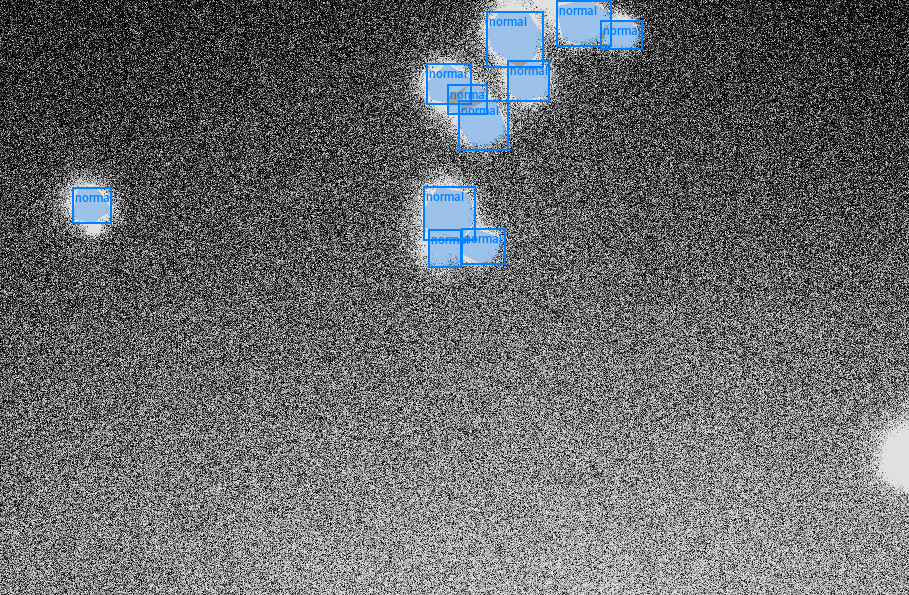

In [ ]:
# Visualize training transformed data
dataset_sample = train_dataset[0]

# Get colors for dataset sample
sample_colors = [int_colors[int(i.item())] for i in dataset_sample[1]['labels']]

# Annotate the sample image with segmentation masks
annotated_tensor = draw_segmentation_masks(
    image=(dataset_sample[0]*255).to(dtype=torch.uint8),
    masks=dataset_sample[1]['masks'],
    alpha=0.3,
    colors=sample_colors
)

# Annotate the sample image with bounding boxes
annotated_tensor = draw_bboxes(
    image=annotated_tensor,
    boxes=dataset_sample[1]['boxes'],
    labels=[class_names[int(i.item())] for i in dataset_sample[1]['labels']],
    colors=sample_colors
)

tensor_to_pil(annotated_tensor)

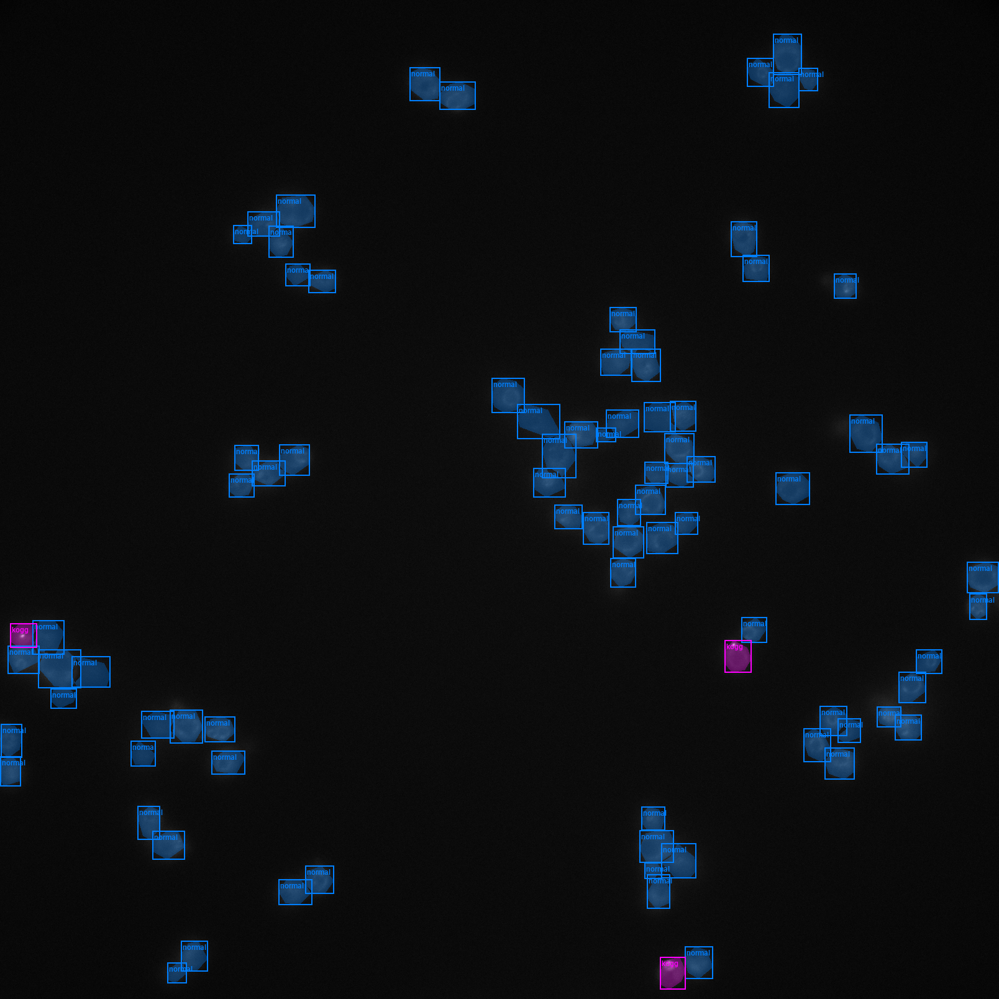

In [ ]:
# Visualizing transformed validation data
dataset_sample = valid_dataset[0]

# Get colors for dataset sample
sample_colors = [int_colors[int(i.item())] for i in dataset_sample[1]['labels']]

# Annotate the sample image with segmentation masks
annotated_tensor = draw_segmentation_masks(
    image=(dataset_sample[0]*255).to(dtype=torch.uint8),
    masks=dataset_sample[1]['masks'],
    alpha=0.3,
    colors=sample_colors
)

# Annotate the sample image with bounding boxes
annotated_tensor = draw_bboxes(
    image=annotated_tensor,
    boxes=dataset_sample[1]['boxes'],
    labels=[class_names[int(i.item())] for i in dataset_sample[1]['labels']],
    colors=sample_colors
)

tensor_to_pil(annotated_tensor)

### 4.3.4 Transfer to Dataloaders

In [ ]:
# batch size
bs = 1

# workers
num_workers = multiprocessing.cpu_count()//2

# define collate function separately
def collate_fn(batch):
    """
    Collate function to be used with DataLoader.
    This function zips the images and targets separately.

    Parameters:
    batch (list): A list of tuples containing images and their corresponding targets.

    Returns:
    tuple: A tuple containing the images and targets.
    """
    return tuple(zip(*batch))


# Define parameters for DataLoader
data_loader_params = {
    'batch_size': bs,  # Batch size for data loading
    'num_workers': num_workers,  # Number of subprocesses to use for data loading
    'persistent_workers': True,  # If True, the data loader will not shutdown the worker processes after a dataset has been consumed once. This allows to maintain the worker dataset instances alive.
    'pin_memory': 'cuda' in device,  # If True, the data loader will copy Tensors into CUDA pinned memory before returning them. Useful when using GPU.
    'pin_memory_device': device if 'cuda' in device else '',  # Specifies the device where the data should be loaded. Commonly set to use the GPU.
    'collate_fn': collate_fn,
    #'collate_fn': lambda batch: tuple(zip(*batch)) # zip(*batch) zips the images and targets separately (img_1, img_2) & (target_1, target_2)
                                                    # tuple() converts the zipped batch into a readable tuple ( (img_1, img_2), (target_1, target_2) )
}

# Create DataLoader for training data. Data is shuffled for every epoch.
train_dataloader = DataLoader(train_dataset, **data_loader_params, shuffle=True)

# Create DataLoader for validation data. Shuffling is not necessary for validation data.
valid_dataloader = DataLoader(valid_dataset, **data_loader_params, shuffle = False)

# Print the number of batches in the training and validation DataLoaders

print(f"Number of batches in train DataLoader: {len(train_dataloader)}")
print(f"Number of batches in validation DataLoader: {len(valid_dataloader)}")

Number of batches in train DataLoader: 16
Number of batches in validation DataLoader: 4


# 5. Fine-Tuning Model

## 5.0 Test forward method

In [ ]:
# images, targets = next(iter(train_dataloader))
# images = list(image for image in images)
# targets = [{k: v for k, v in t.items()} for t in targets]
# model.train()
# output = model(images, targets)

Train output format:

{'loss_classifier': tensor(1.0237, grad_fn=<NllLossBackward0>),
 'loss_box_reg': tensor(0.2639, grad_fn=<DivBackward0>),
 'loss_mask': tensor(1.4003, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>),
 'loss_objectness': tensor(5.4521, grad_fn=<BinaryCrossEntropyWithLogitsBackward0>),
 'loss_rpn_box_reg': tensor(0.3700, grad_fn=<DivBackward0>)}

targets format:

[
  
  {"masks":Mask(torch.Tensor(torch.bool)),

  "boxes":BoundingBoxes(torch.Tensor(torch.
  float32)),

  "labels":torch.Tensor(int)},

 {repeat for item 2 in batch},

 ...

 ]

## 5.1 Training Loop

In [ ]:
def train_one_epoch(model, dataloader, device, optimizer, scaler=None):
  """
  """
  # train
  model.train()

  # loop over data
  for batch, (inputs, targets) in tqdm(enumerate(dataloader)):
    inputs = torch.stack(inputs).to(device)
    targets = [{k: v.to(device) if isinstance(v,torch.Tensor) else v for k,v in t.items()} for t in targets]

    # forward pass & loss
    loss_dict = model(inputs, targets) # train loss format
    losses = sum(loss for loss in loss_dict.values())

    # optimizer 0 grad
    optimizer.zero_grad()

    # Option 1: Scaler
    if scaler is not None:
      print('not yet implimented, try without scaler')
      sys.exit(0)

    # Option 2: backward pass & optimizer step
    else:
      losses.backward()
      optimizer.step()
    print(f"training losses: {losses}")

## 5.2 TODO: Testing Loop

In [ ]:
def compute_ap(gt_boxes,gt_class_ids,gt_masks,pred_boxes,pred_scores,pred_masks,iou_threshold=0.5):
  """
  Compute Average Precision at IoU threshold.

  Returns:
  mAP
  precisions (list)
  recalls (list)
  IoU overlaps [pred_boxes, gt_boxes]
  """
  pass


In [ ]:
def test_one_epoch(model, dataloader, device):
  """
  """
  # train
  model.eval()

  # loop over data
  with torch.inference_mode():
    for batch, (inputs, targets) in tqdm(enumerate(dataloader)):
      inputs = torch.stack(inputs).to(device)
      targets = [{k: v.to(device) if isinstance(v,torch.Tensor) else v for k,v in t.items()} for t in targets]

      # forward pass & loss
      detections = model(inputs)
      # accuracy_dict = compute_ap(gt_boxes = ,
      #                            gt_class_ids = ,
      #                            gt_masks = ,
      #                            pred_boxes = ,
      #                            pred_scores = ,
      #                            pred_masks = ,
      #                            iou_threshold = )


## 5.2 Training the Model

In [ ]:
# parameters
optimizer = torch.optim.SGD(params=model.parameters(),
                            lr = 0.1)
num_epochs = 4
for epoch in range(num_epochs):
  # train
  train_one_epoch(model=model,
                  dataloader=train_dataloader,
                  device=device,
                  optimizer=optimizer)



0it [00:00, ?it/s]

training losses: 7.9646897315979
training losses: 5.436853885650635
training losses: 4.70405387878418
training losses: 2.280292272567749
training losses: 3.736788272857666
training losses: 2.497648239135742
training losses: 2.5154528617858887
training losses: 2.094588279724121
training losses: 2.1431167125701904
training losses: 1.6277799606323242
training losses: 1.922183632850647
training losses: 2.5022919178009033
training losses: 1.6941555738449097
training losses: 1.6181682348251343
training losses: 1.4641880989074707
training losses: 1.789384126663208


0it [00:00, ?it/s]

training losses: 1.494764804840088
training losses: 2.146829843521118
training losses: 2.8078036308288574
training losses: 1.9916448593139648
training losses: 1.7051726579666138
training losses: 2.0370917320251465
training losses: 2.571519374847412
training losses: 2.520744562149048
training losses: 2.167184829711914
training losses: 2.614469289779663
training losses: 1.9847350120544434
training losses: 1.9874334335327148
training losses: 1.6650066375732422
training losses: 1.7646373510360718
training losses: 1.8085249662399292
training losses: 2.9625065326690674


0it [00:00, ?it/s]

training losses: 1.5972639322280884
training losses: 1.9495371580123901
training losses: 1.7298014163970947
training losses: 1.6670056581497192
training losses: 2.3407745361328125
training losses: 3.2559897899627686
training losses: 2.435419797897339
training losses: 2.067263126373291
training losses: 1.7147170305252075
training losses: 1.8631736040115356
training losses: 3.1768481731414795
training losses: 1.8545821905136108
training losses: 1.9506109952926636
training losses: 1.9298056364059448
training losses: 1.6005641222000122
training losses: 2.1540699005126953


0it [00:00, ?it/s]

training losses: 1.9241284132003784
training losses: 1.989536166191101
training losses: 1.8272477388381958
training losses: 1.7831857204437256
training losses: 2.3316938877105713
training losses: 1.6341280937194824
training losses: 1.4381709098815918
training losses: 1.8539990186691284
training losses: 1.5868533849716187
training losses: 1.6846555471420288
training losses: 1.8881155252456665
training losses: 1.5982840061187744
training losses: 1.6163400411605835
training losses: 1.2749578952789307
training losses: 1.2113412618637085
training losses: 1.5229089260101318


In [ ]:
# Saving our PyTorch model
from pathlib import Path

# 1. Create models directory
MODEL_PATH = Path("models")
MODEL_PATH.mkdir(parents=True, exist_ok=True)

# 2. Create model save path
timestamp = datetime.datetime.now().strftime("%Y-%m-%d_%H-%M-%S")
MODEL_NAME = "".join(["model0_", timestamp,".pth"])
MODEL_SAVE_PATH = MODEL_PATH / MODEL_NAME

# 3. Save model state dict
print(f"Saving model to: {MODEL_SAVE_PATH}")
torch.save(obj=model.state_dict(),
           f=MODEL_SAVE_PATH)

Saving model to: models/model0_2024-08-08_22-55-57.pth


# 6. Making Predictions Using the Model

## 6.1 Pick validation img

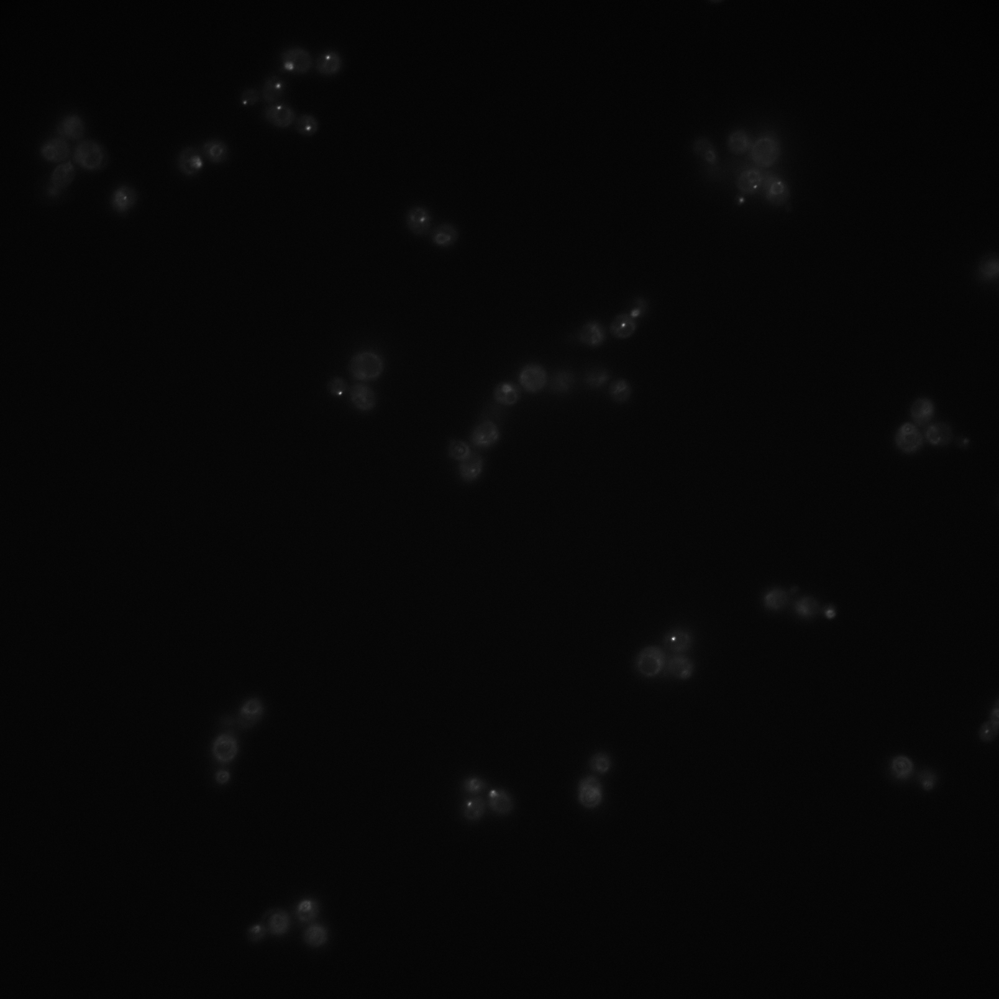

In [ ]:
random_file_id = random.choice(files_test)
random_file = img_dict[random_file_id]
test_img = Image.open(random_file).convert("RGB")
display(test_img)

## 6.2 Get corresponding annotation data

In [ ]:
target_shape_points = [shape['points'] for shape in annotation_df.loc[random_file_id]['shapes']]
target_all_shapes = [[tuple(p) for p in points] for points in target_shape_points]
target_mask_imgs = [create_polygon_mask(test_img.size,shape) for shape in target_all_shapes]
target_masks = Mask(torch.concat(
    [Mask(transforms.PILToTensor()(mask), dtype = torch.bool) for mask in target_mask_imgs]
))

target_labels = [shape['label'] for shape in annotation_df.loc[random_file_id]['shapes']]
target_bboxes = BoundingBoxes(data=torchvision.ops.masks_to_boxes(target_masks), format = 'xyxy', canvas_size = test_img.size[::-1])

## 6.3 Forward Pass

In [ ]:
model.eval()
model.to(device)
input_tensor = transforms.Compose([transforms.ToImage(),
                                   transforms.ToDtype(torch.float32, scale = True)])(test_img)[None].to(device)
with torch.inference_mode():
  model_output = model(input_tensor)

## 6.4 Annotate image with model predictions



In [ ]:
# filter output
threshold = 0.05
scores_mask = model_output[0]['scores'] > threshold

# get output bboxes and labels
pred_bboxes = BoundingBoxes(model_output[0]['boxes'][scores_mask], format='xyxy',canvas_size=test_img.size[::-1])
pred_labels = [class_names[int(label)] for label in model_output[0]['labels'][scores_mask]]

# get output masks
pred_scores = model_output[0]['scores']
pred_masks_filtered = model_output[0]['masks'][scores_mask]
pred_masks = torch.concat([Mask(torch.where(mask >= threshold, 1, 0), dtype = torch.bool) for mask in pred_masks_filtered])

# summary
print(f"no. labels: {len(pred_labels)}")

no. labels: 2


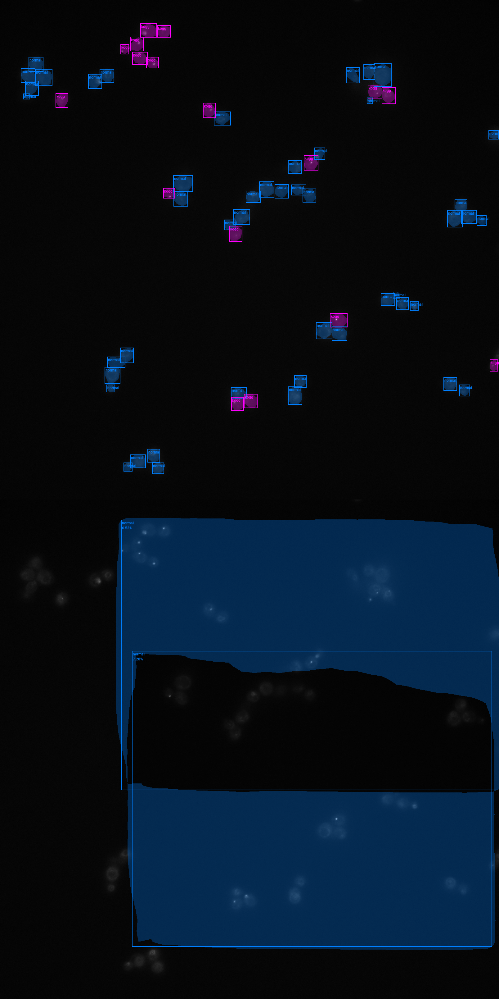

Target BBoxes: normal: tensor([ 475., 1445.,  515., 1488.]), normal: tensor([ 490., 1489.,  528., 1525.]), normal: tensor([ 419., 1463.,  469., 1506.]), normal: tensor([ 398., 1489.,  426., 1517.]), normal: tensor([ 343., 1238.,  370., 1262.]), normal: tensor([ 337., 1181.,  387., 1235.]), normal: tensor([ 345., 1148.,  403., 1183.]), normal: tensor([ 387., 1119.,  430., 1168.]), normal: tensor([ 744., 1246.,  794., 1282.]), normal: tensor([ 928., 1244.,  973., 1302.]), normal: tensor([ 948., 1208.,  987., 1247.]), normal: tensor([722., 707., 760., 740.]), normal: tensor([751., 673., 805., 723.]), normal: tensor([559., 615., 605., 664.]), normal: tensor([558., 564., 621., 617.]), normal: tensor([792., 614., 839., 652.]), normal: tensor([835., 584., 883., 635.]), normal: tensor([885., 593., 930., 638.]), normal: tensor([938., 594., 986., 628.]), normal: tensor([928., 516., 972., 558.]), normal: tensor([689., 359., 743., 403.]), normal: tensor([113., 222., 168., 276.]), normal: tensor([ 

In [ ]:
from cjm_pil_utils.core import stack_imgs

# colors
target_colors = [int_colors[i] for i in [class_names.index(label) for label in target_labels]]
pred_colors = [int_colors[i] for i in [class_names.index(label) for label in pred_labels]]

# convert image to tensor
img_tensor = transforms.PILToTensor()(test_img)

# annotate image with GT masks and bounding boxes
annotated_tensor = draw_segmentation_masks(image=img_tensor, masks = target_masks, alpha = 0.3, colors = target_colors)
annotated_tensor = draw_bboxes(image=annotated_tensor, boxes = target_bboxes, labels = target_labels, colors = target_colors)
gt_annotated_test_img = tensor_to_pil(annotated_tensor)

# annotate image with prediction masks and bounding boxes
annotated_tensor = draw_segmentation_masks(image=img_tensor, masks = pred_masks, alpha = 0.3, colors = pred_colors)
annotated_tensor = draw_bboxes(image=annotated_tensor,
                               boxes = pred_bboxes,
                               labels = [f"{label}\n{prob*100:.2f}%" for label, prob in zip(pred_labels, pred_scores)],
                               colors = pred_colors)
pred_annotated_test_img = tensor_to_pil(annotated_tensor)

# visualize
display(stack_imgs([gt_annotated_test_img, pred_annotated_test_img]))

# summary print statements
target_bboxes = ", ".join([f"{label}: {bbox}" for label, bbox in zip(target_labels, target_bboxes)])
pred_bboxes = ", ".join([f"{label}: {bbox}" for label, bbox in zip(pred_labels, pred_bboxes)])
confidence_scores = ", ".join([f"{label}:{score*100:.2f}%" for label, score in zip(pred_labels, pred_scores)])
print(f"Target BBoxes: {target_bboxes}")
print(f"Predicted BBoxes: {pred_bboxes}")
print(f"Confidence Scores: {confidence_scores}")